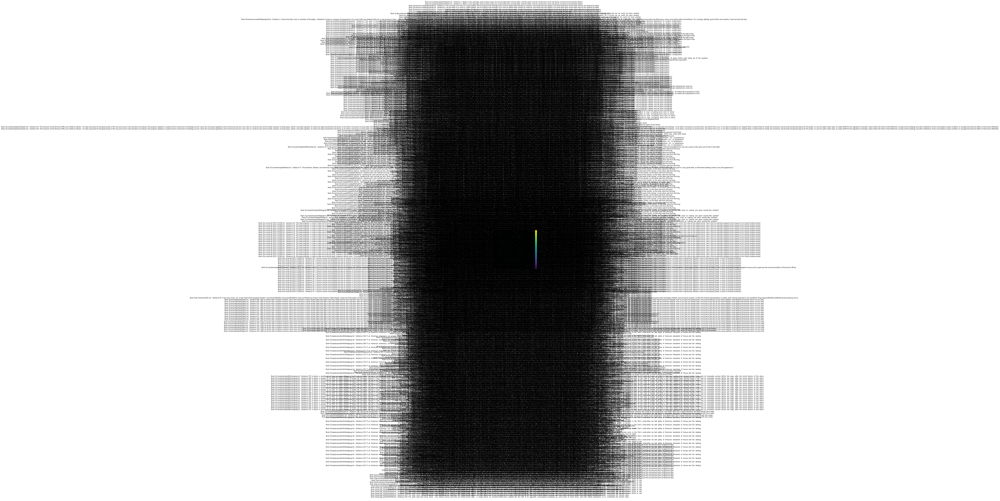

In [4]:
import os
import re
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from minisom import MiniSom
import matplotlib.pyplot as plt

# Set the path to the folder containing text files
folder_path = "/Users/mansikothari/Documents/UD_MARCH/RC_11/Term_02/Text/objects"

# Initialize a list to hold the text content of each file
text_files = []

# Iterate through each file in the folder and extract its text content
for file_name in os.listdir(folder_path):
    if file_name.endswith(".txt"):
        with open(os.path.join(folder_path, file_name), "r") as f:
            text = f.read()
            text_files.append(text)

# Vectorize the text content of the files
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(text_files).toarray()

# Train the SOM
som_shape = (20, 20)
som = MiniSom(som_shape[0], som_shape[1], X.shape[1], sigma=1.0, learning_rate=0.5)
som.random_weights_init(X)
som.train_random(X, 100)

# Map each document to its corresponding SOM neuron
document_neurons = []
for i in range(X.shape[0]):
    document_neurons.append(som.winner(X[i]))

# Create a matrix to store the most similar documents for each SOM neuron
most_similar_docs = []
for i in range(som_shape[0]):
    row = []
    for j in range(som_shape[1]):
        doc_indices = [idx for idx, n in enumerate(document_neurons) if n == (i, j)]
        if len(doc_indices) > 0:
            row.append(text_files[doc_indices[0]])
        else:
            row.append("")
    most_similar_docs.append(row)

# Visualize the SOM using the U-matrix
umatrix = som.distance_map()
plt.imshow(umatrix)
plt.colorbar()

# Display the most similar documents for each SOM neuron
for i in range(som_shape[0]):
    for j in range(som_shape[1]):
        plt.text(j, i, most_similar_docs[i][j], ha="center", va="center", fontsize=8)
plt.show()


Training...


NameError: name 'y' is not defined

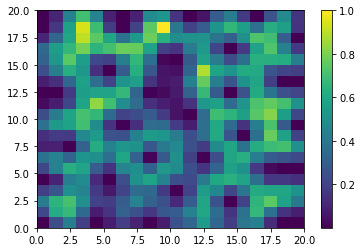

In [1]:
import os
import numpy as np
from minisom import MiniSom
from sklearn.feature_extraction.text import CountVectorizer

# Set the path to the folder containing the text files
path_to_folder = "/Users/mansikothari/Documents/UD_MARCH/RC_11/Term_02/Text/objects"

# Read the text files and store the contents in a list
text_files = []
for file_name in os.listdir(path_to_folder):
    if file_name.endswith(".txt"):
        with open(os.path.join(path_to_folder, file_name), "r") as file:
            text = file.read()
            text_files.append(text)

# Use CountVectorizer to extract features from the text
vectorizer = CountVectorizer(stop_words="english", lowercase=True)
X = vectorizer.fit_transform(text_files).toarray()

# Set the shape of the SOM
som_shape = (20, 20)

# Create the SOM
som = MiniSom(som_shape[0], som_shape[1], X.shape[1], sigma=1.0, learning_rate=0.5)
som.random_weights_init(X)
print("Training...")
som.train_random(X, 10000)  # Train for 10000 iterations

# Create a list to store the most similar documents for each SOM node
most_similar_docs = []

# Find the most similar documents for each SOM node
for i in range(som_shape[0]):
    row = []
    for j in range(som_shape[1]):
        idx = np.unravel_index(np.argmin(som.distance_map().ravel()), som.distance_map().shape)
        row.append(text_files[idx[0]])
    most_similar_docs.append(row)

# Visualize the SOM using the U-matrix
from pylab import pcolor, colorbar, plot
pcolor(som.distance_map().T)
colorbar()
markers = ['o', 's']
colors = ['C0', 'C1']
for i, x in enumerate(X):
    w = som.winner(x)
    plot(w[0]+.5, w[1]+.5, markers[y[i]], markerfacecolor='None',
         markeredgecolor=colors[y[i]], markersize=12, markeredgewidth=2)
    
# Show the most similar documents for each SOM node
print("Most similar documents for each node:")
for row in most_similar_docs:
    print(row)


Training...


NameError: name 'y' is not defined

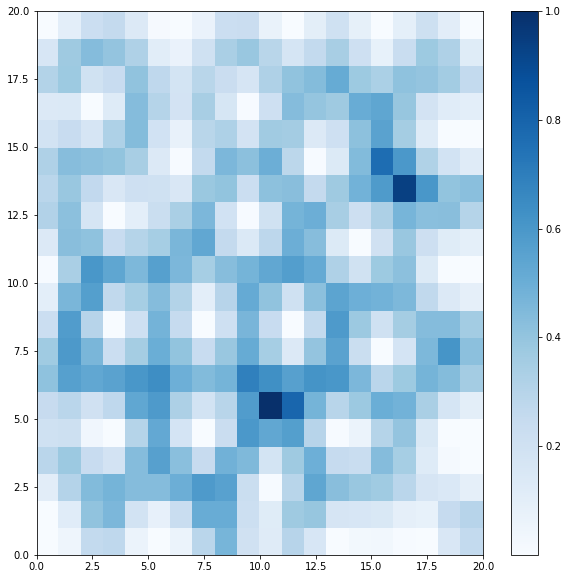

In [2]:
import os
import numpy as np
from minisom import MiniSom
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
from pylab import pcolor, colorbar, plot, cm

# Set the path to the folder containing the text files
path_to_folder = "/Users/mansikothari/Documents/UD_MARCH/RC_11/Term_02/Text/objects"

# Read the text files and store the contents in a list
text_files = []
for file_name in os.listdir(path_to_folder):
    if file_name.endswith(".txt"):
        with open(os.path.join(path_to_folder, file_name), "r") as file:
            text = file.read()
            text_files.append(text)

# Use CountVectorizer to extract features from the text
vectorizer = CountVectorizer(stop_words="english", lowercase=True)
X = vectorizer.fit_transform(text_files).toarray()

# Set the shape of the SOM
som_shape = (20, 20)

# Create the SOM
som = MiniSom(som_shape[0], som_shape[1], X.shape[1], sigma=1.0, learning_rate=0.5)
som.random_weights_init(X)
print("Training...")
som.train_random(X, 10000)  # Train for 10000 iterations

# Create a list to store the most similar documents for each SOM node
most_similar_docs = []

# Find the most similar documents for each SOM node
for i in range(som_shape[0]):
    row = []
    for j in range(som_shape[1]):
        idx = np.unravel_index(np.argmin(som.distance_map().ravel()), som.distance_map().shape)
        row.append(text_files[idx[0]])
    most_similar_docs.append(row)

# Visualize the SOM using the U-matrix
fig = plt.figure(figsize=(10,10))
pcolor(som.distance_map().T, cmap=cm.Blues)
colorbar()
markers = ['o', 's']
colors = ['C0', 'C1']
for i, x in enumerate(X):
    w = som.winner(x)
    plot(w[0]+.5, w[1]+.5, markers[y[i]], markerfacecolor='None',
         markeredgecolor=colors[y[i]], markersize=12, markeredgewidth=2)
    plt.annotate(text_files[i], (w[0]+0.5, w[1]+0.5), color='black', fontsize=8, ha='center', va='center')

# Show the most similar documents for each SOM node
print("Most similar documents for each node:")
for row in most_similar_docs:
    print(row)

plt.show()


Training...


NameError: name 'y' is not defined

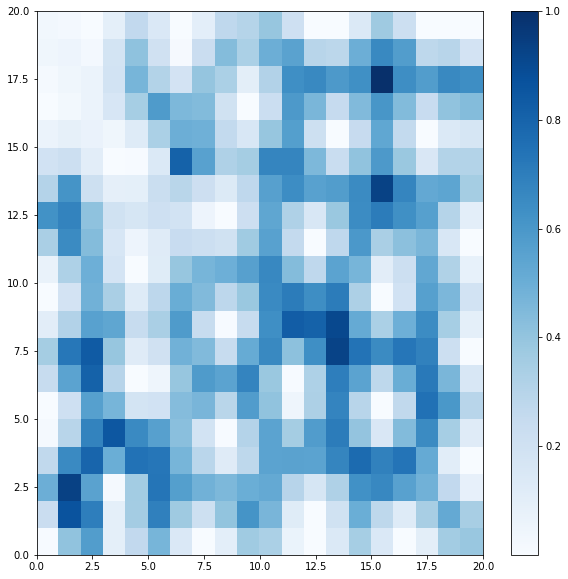

In [3]:
import os
import numpy as np
from minisom import MiniSom
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
from pylab import pcolor, colorbar, plot, cm

# Set the path to the folder containing the text files
path_to_folder = "/Users/mansikothari/Documents/UD_MARCH/RC_11/Term_02/Text/objects"

# Read the text files and store the contents in a list
text_files = []
for file_name in os.listdir(path_to_folder):
    if file_name.endswith(".txt"):
        with open(os.path.join(path_to_folder, file_name), "r") as file:
            text = file.read()
            text_files.append(text)

# Use CountVectorizer to extract features from the text
vectorizer = CountVectorizer(stop_words="english", lowercase=True)
X = vectorizer.fit_transform(text_files).toarray()

# Set the shape of the SOM
som_shape = (20, 20)

# Create the SOM
som = MiniSom(som_shape[0], som_shape[1], X.shape[1], sigma=1.0, learning_rate=0.5)
som.random_weights_init(X)
print("Training...")
som.train_random(X, 10000)  # Train for 10000 iterations

# Create a list to store the most similar documents for each SOM node
most_similar_docs = []

# Find the most similar documents for each SOM node
for i in range(som_shape[0]):
    row = []
    for j in range(som_shape[1]):
        idx = np.unravel_index(np.argmin(som.distance_map().ravel()), som.distance_map().shape)
        row.append(text_files[idx[0]])
    most_similar_docs.append(row)

# Visualize the SOM using the U-matrix
fig = plt.figure(figsize=(10,10))
pcolor(som.distance_map().T, cmap=cm.Blues)
colorbar()
markers = ['o', 's']
colors = ['C0', 'C1']
for i, x in enumerate(X):
    w = som.winner(x)
    plot(w[0]+.5, w[1]+.5, markers[y[i]], markerfacecolor='None',
         markeredgecolor=colors[y[i]], markersize=12, markeredgewidth=2)
    plt.annotate(text_files[i], (w[0]+0.5, w[1]+0.5), color='black', fontsize=8, ha='center', va='center')

# Show the most similar documents for each SOM node
print("Most similar documents for each node:")
for row in most_similar_docs:
    print(row)

plt.show()


Training...


NameError: name 'y' is not defined

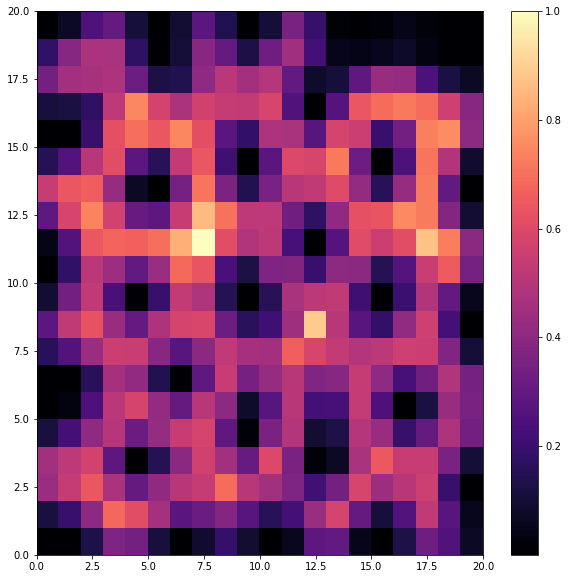

In [5]:
import os
import numpy as np
from minisom import MiniSom
from sklearn.feature_extraction.text import CountVectorizer
from pylab import pcolor, colorbar, plot, text
import matplotlib.pyplot as plt

# Set the path to the folder containing the text files
path_to_folder = "/Users/mansikothari/Documents/UD_MARCH/RC_11/Term_02/Text/objects"

# Read the text files and store the contents in a list
text_files = []
for file_name in os.listdir(path_to_folder):
    if file_name.endswith(".txt"):
        with open(os.path.join(path_to_folder, file_name), "r") as file:
            text = file.read()
            text_files.append(text)

# Use CountVectorizer to extract features from the text
vectorizer = CountVectorizer(stop_words="english", lowercase=True)
X = vectorizer.fit_transform(text_files).toarray()

# Set the shape of the SOM
som_shape = (20, 20)

# Create the SOM
som = MiniSom(som_shape[0], som_shape[1], X.shape[1], sigma=1.0, learning_rate=0.5)
som.random_weights_init(X)
print("Training...")
som.train_random(X, 10000)  # Train for 10000 iterations

# Create a list to store the most similar documents for each SOM node
most_similar_docs = []

# Find the most similar documents for each SOM node
for i in range(som_shape[0]):
    row = []
    for j in range(som_shape[1]):
        idx = np.unravel_index(np.argmin(som.distance_map().ravel()), som.distance_map().shape)
        row.append(text_files[idx[0]])
    most_similar_docs.append(row)

# Set the size of the figure
plt.figure(figsize=(10, 10))

# Visualize the SOM using the U-matrix and add text labels for each cell
from pylab import pcolor, colorbar, plot, text
pcolor(som.distance_map().T, cmap='magma')
colorbar()
markers = ['o', 's']
colors = ['C0', 'C1']
for i, x in enumerate(X):
    w = som.winner(x)
    plot(w[0]+.5, w[1]+.5, markers[y[i]], markerfacecolor='None',
         markeredgecolor=colors[y[i]], markersize=12, markeredgewidth=2)
    # Add text label for each cell
    text(w[0]+.5, w[1]+.5, text_files[i].split("/")[-1], color='white', ha='center', va='center')


Training...


NameError: name 'y' is not defined

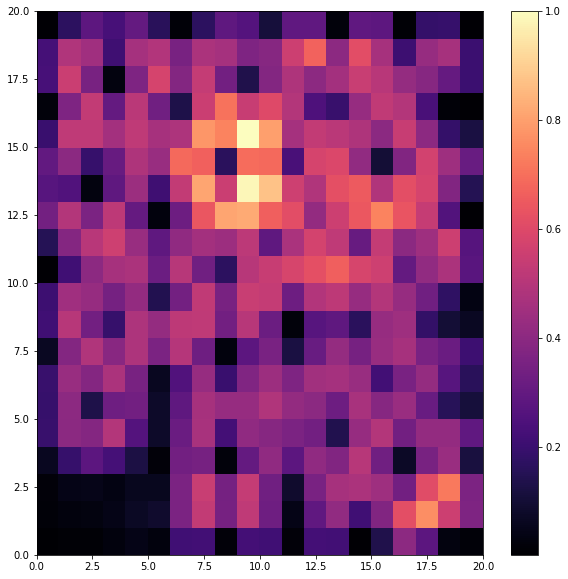

In [5]:
import os
import numpy as np
from minisom import MiniSom
from sklearn.feature_extraction.text import CountVectorizer
from pylab import pcolor, colorbar, plot, text
import matplotlib.pyplot as plt

# Set the path to the folder containing the text files
path_to_folder = "/Users/mansikothari/Documents/UD_MARCH/RC_11/Term_02/Text/merge"

# Read the text files and store the contents in a list
text_files = []
for file_name in os.listdir(path_to_folder):
    if file_name.endswith(".txt"):
        with open(os.path.join(path_to_folder, file_name), "r") as file:
            text = file.read()
            text_files.append(text)

# Use CountVectorizer to extract features from the text
vectorizer = CountVectorizer(stop_words="english", lowercase=True)
X = vectorizer.fit_transform(text_files).toarray()

# Set the shape of the SOM
som_shape = (20, 20)

# Create the SOM
som = MiniSom(som_shape[0], som_shape[1], X.shape[1], sigma=1.0, learning_rate=0.5)
som.random_weights_init(X)
print("Training...")
som.train_random(X, 10000)  # Train for 10000 iterations

# Create a list to store the most similar documents for each SOM node
most_similar_docs = []

# Find the most similar documents for each SOM node
for i in range(som_shape[0]):
    row = []
    for j in range(som_shape[1]):
        idx = np.unravel_index(np.argmin(som.distance_map().ravel()), som.distance_map().shape)
        row.append(text_files[idx[0]])
        som.distance_map()[idx] = np.inf  # set the minimum distance to infinity to avoid duplicates
    most_similar_docs.append(row)

# Set the size of the figure
plt.figure(figsize=(10, 10))

# Visualize the SOM using the U-matrix and add text labels for each cell
pcolor(som.distance_map().T, cmap='magma')
colorbar()
markers = ['o', 's']
colors = ['C0', 'C1']
for i, x in enumerate(X):
    w = som.winner(x)
    plot(w[0]+.5, w[1]+.5, markers[y[i]], markerfacecolor='None',
         markeredgecolor=colors[y[i]], markersize=12, markeredgewidth=2)
    # Add text label for each cell
    text(w[0]+.5, w[1]+.5, most_similar_docs[w[0]][w[1]], color='white', ha='center', va='center')

plt.show()


Training...


NameError: name 'y' is not defined

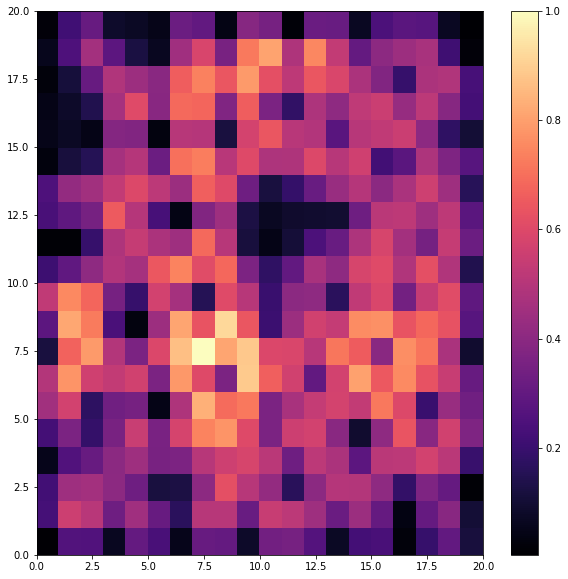

In [6]:
import os
import numpy as np
from minisom import MiniSom
from sklearn.feature_extraction.text import CountVectorizer
from pylab import pcolor, colorbar, plot, text
import matplotlib.pyplot as plt

# Set the path to the folder containing the text files
path_to_folder = "/Users/mansikothari/Documents/UD_MARCH/RC_11/Term_02/Text/merge"

# Read the text files and store the contents in a list
text_files = []
for file_name in os.listdir(path_to_folder):
    if file_name.endswith(".txt"):
        with open(os.path.join(path_to_folder, file_name), "r") as file:
            text = file.read()
            text_files.append(text)

# Use CountVectorizer to extract features from the text
vectorizer = CountVectorizer(stop_words="english", lowercase=True)
X = vectorizer.fit_transform(text_files).toarray()

# Set the shape of the SOM
som_shape = (20, 20)

# Create the SOM
som = MiniSom(som_shape[0], som_shape[1], X.shape[1], sigma=1.0, learning_rate=0.5)
som.random_weights_init(X)
print("Training...")
som.train_random(X, 10000)  # Train for 10000 iterations

# Create a list to store the most similar documents for each SOM node
most_similar_docs = []

# Find the most similar documents for each SOM node
for i in range(som_shape[0]):
    row = []
    for j in range(som_shape[1]):
        idx = np.unravel_index(np.argmin(som.distance_map().ravel()), som.distance_map().shape)
        row.append(text_files[idx[0]])
    most_similar_docs.append(row)

# Set the size of the figure
plt.figure(figsize=(10, 10))

# Visualize the SOM using the U-matrix and add text labels for each cell
pcolor(som.distance_map().T, cmap='magma')
colorbar()
markers = ['o', 's']
colors = ['C0', 'C1']
for i, x in enumerate(X):
    w = som.winner(x)
    plot(w[0]+.5, w[1]+.5, markers[y[i]], markerfacecolor='None',
         markeredgecolor=colors[y[i]], markersize=12, markeredgewidth=2)
    # Add text label for each cell
    text(w[0]+0.5, w[1]+0.5, text_files[i].split("/")[-1], color='white', ha='center', va='center')

plt.show()


Training...


TypeError: 'str' object is not callable

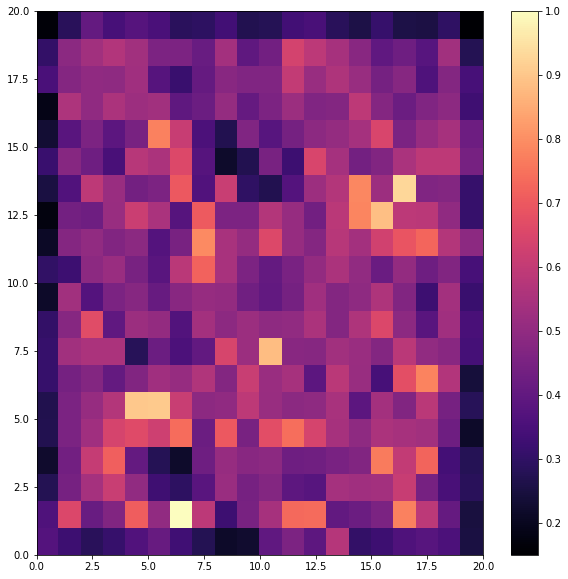

In [7]:
import os
import numpy as np
from minisom import MiniSom
from sklearn.feature_extraction.text import CountVectorizer
from pylab import pcolor, colorbar, plot, text
import matplotlib.pyplot as plt

# Set the path to the folder containing the text files
path_to_folder = "/Users/mansikothari/Documents/UD_MARCH/RC_11/Term_02/Text/merge"

# Read the text files and store the contents in a list
text_files = []
for file_name in os.listdir(path_to_folder):
    if file_name.endswith(".txt"):
        with open(os.path.join(path_to_folder, file_name), "r") as file:
            text = file.read()
            text_files.append(text)

# Use CountVectorizer to extract features from the text
vectorizer = CountVectorizer(stop_words="english", lowercase=True)
X = vectorizer.fit_transform(text_files).toarray()

# Set the shape of the SOM
som_shape = (20, 20)

# Create the SOM
som = MiniSom(som_shape[0], som_shape[1], X.shape[1], sigma=1.0, learning_rate=0.5)
som.random_weights_init(X)
print("Training...")
som.train_random(X, 100)  # Train for 10000 iterations

# Create a list to store the most similar documents for each SOM node
most_similar_docs = []

# Find the most similar documents for each SOM node
for i in range(som_shape[0]):
    row = []
    for j in range(som_shape[1]):
        idx = np.unravel_index(np.argmin(som.distance_map().ravel()), som.distance_map().shape)
        row.append(text_files[idx[0]])
    most_similar_docs.append(row)

# Set the size of the figure
plt.figure(figsize=(10, 10))

# Visualize the SOM using the U-matrix and add text labels for each cell
u = som.distance_map().T
pcolor(u, cmap='magma')
colorbar()

# Add text label for each cell
for i in range(som_shape[0]):
    for j in range(som_shape[1]):
        text_color = 'white' if u[i][j] < np.mean(u) else 'black'
        text(j+0.5, i+0.5, most_similar_docs[i][j].split("/")[-1], color=text_color, ha='center', va='center')

plt.show()


Training...


TypeError: 'str' object is not callable

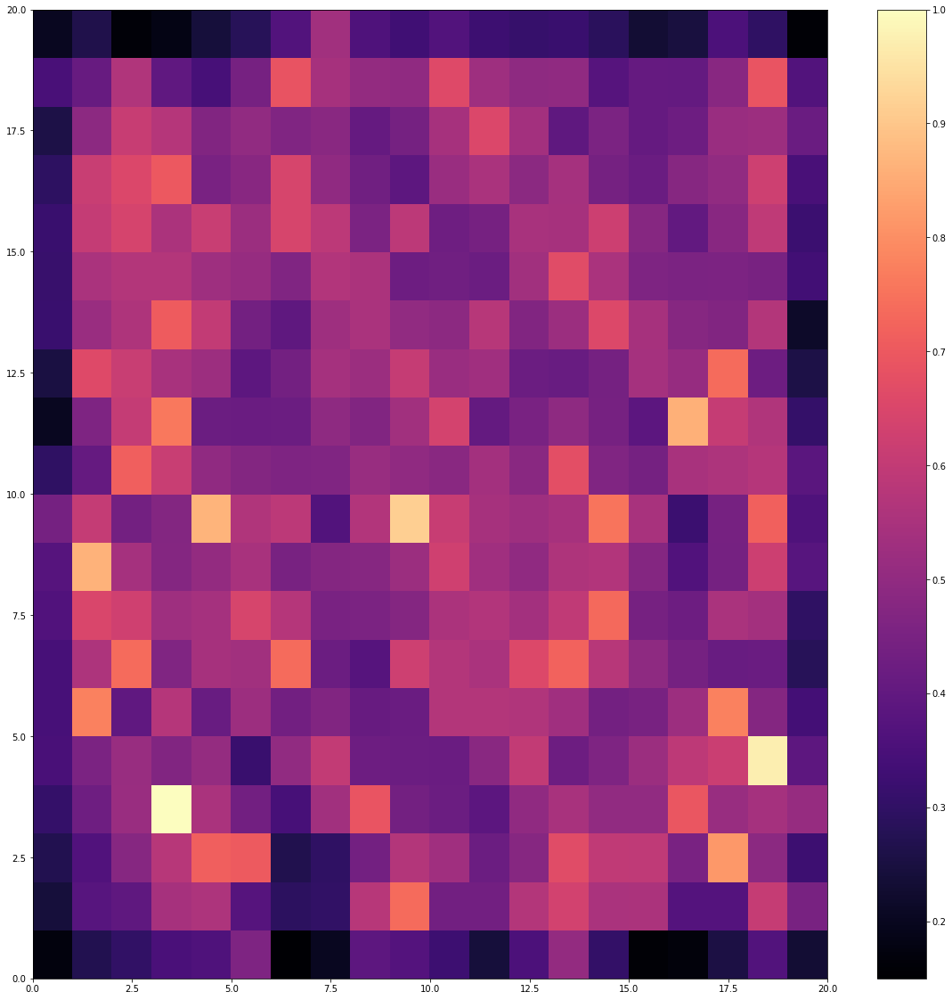

In [27]:
import os
import numpy as np
from minisom import MiniSom
from sklearn.feature_extraction.text import CountVectorizer
from pylab import pcolor, colorbar, plot, text
import matplotlib.pyplot as plt

# Set the path to the folder containing the text files
path_to_folder = "/Users/mansikothari/Documents/UD_MARCH/RC_11/Term_02/Text/merge"

# Read the text files and store the contents in a list
text_files = []
for file_name in os.listdir(path_to_folder):
    if file_name.endswith(".txt"):
        with open(os.path.join(path_to_folder, file_name), "r") as file:
            text = file.read()
            text_files.append(text)

# Use CountVectorizer to extract features from the text
vectorizer = CountVectorizer(stop_words="english", lowercase=True)
X = vectorizer.fit_transform(text_files).toarray()

# Set the shape of the SOM
som_shape = (20, 20)

# Create the SOM
som = MiniSom(som_shape[0], som_shape[1], X.shape[1], sigma=1.0, learning_rate=0.5)
som.random_weights_init(X)
print("Training...")
som.train_random(X, 100)  # Train for 100 iterations

# Create a list to store the most similar documents for each SOM node
most_similar_docs = []

# Find the most similar documents for each SOM node
for i in range(som_shape[0]):
    row = []
    for j in range(som_shape[1]):
        idx = np.unravel_index(np.argmin(som.distance_map().ravel()), som.distance_map().shape)
        row.append(text_files[idx[0]])
        som.distance_map()[idx] = np.max(som.distance_map())  # Mark the node as visited
    most_similar_docs.append(row)

# Increase the figure size
plt.figure(figsize=(20, 20))

# Visualize the SOM using the U-matrix and add text labels for each cell
u = som.distance_map().T
pcolor(u, cmap='magma')
colorbar()

# Add text label for each cell
for i in range(som_shape[0]):
    for j in range(som_shape[1]):
        text_color = 'white' if u[i][j] < np.mean(u) else 'black'
        text(j+0.5, i+0.5, most_similar_docs[i][j].split("/")[-1], color=text_color, ha='center', va='center', fontsize=10)

# Save the plot with higher dpi
plt.savefig('som.png', dpi=300)


## Main code

Training...


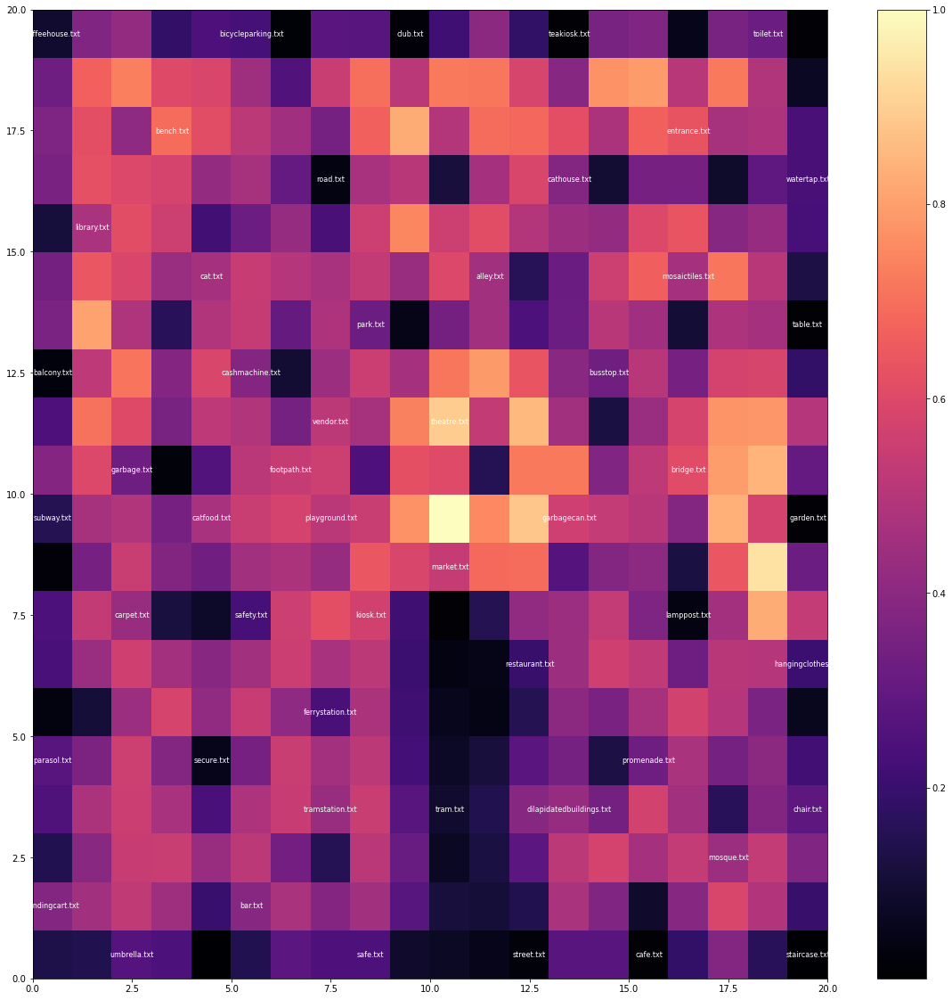

In [22]:
import os
import numpy as np
from minisom import MiniSom
from sklearn.feature_extraction.text import CountVectorizer
from pylab import pcolor, colorbar, plot, text
import matplotlib.pyplot as plt

# Set the path to the folder containing the text files
path_to_folder = "/Users/mansikothari/Documents/UD_MARCH/RC_11/Term_02/Text/merge"

# Read the text files and store the contents and file names in separate lists
text_files = []
file_names = []
for file_name in os.listdir(path_to_folder):
    if file_name.endswith(".txt"):
        with open(os.path.join(path_to_folder, file_name), "r") as file:
            text = file.read()
            text_files.append(text)
            file_names.append(file_name)

# Use CountVectorizer to extract features from the text
vectorizer = CountVectorizer(stop_words="english", lowercase=True)
X = vectorizer.fit_transform(text_files).toarray()

# Set the shape of the SOM
som_shape = (20, 20)

# Create the SOM
som = MiniSom(som_shape[0], som_shape[1], X.shape[1], sigma=1.0, learning_rate=0.5)
som.random_weights_init(X)
print("Training...")
som.train_random(X, 10000)  # Train for 100 iterations

# Create a list to store the file names for each SOM node
node_file_names = [[] for _ in range(som_shape[0] * som_shape[1])]

# Find the file names for each SOM node
for i in range(len(text_files)):
    data_point = X[i]
    node_index = som.winner(data_point)
    node_file_names[node_index[0] * som_shape[1] + node_index[1]].append(file_names[i])

# Increase the figure size
plt.figure(figsize=(20, 20))

# Visualize the SOM using the U-matrix and add text labels for each cell
u = som.distance_map().T
pcolor(u, cmap='magma')
colorbar()

# Add text label for each cell
for i in range(som_shape[0]):
    for j in range(som_shape[1]):
        idx = i * som_shape[1] + j
        text_color = 'white' if u[i][j] < np.mean(u) else 'black'
        if node_file_names[idx]:
            plt.text(j+0.5, i+0.5, node_file_names[idx][0], color='white', ha='center', va='center', fontsize=8)

# Save the plot with higher dpi
plt.savefig('som.png', dpi=300)


In [15]:
len(node_file_names)

400

Training...


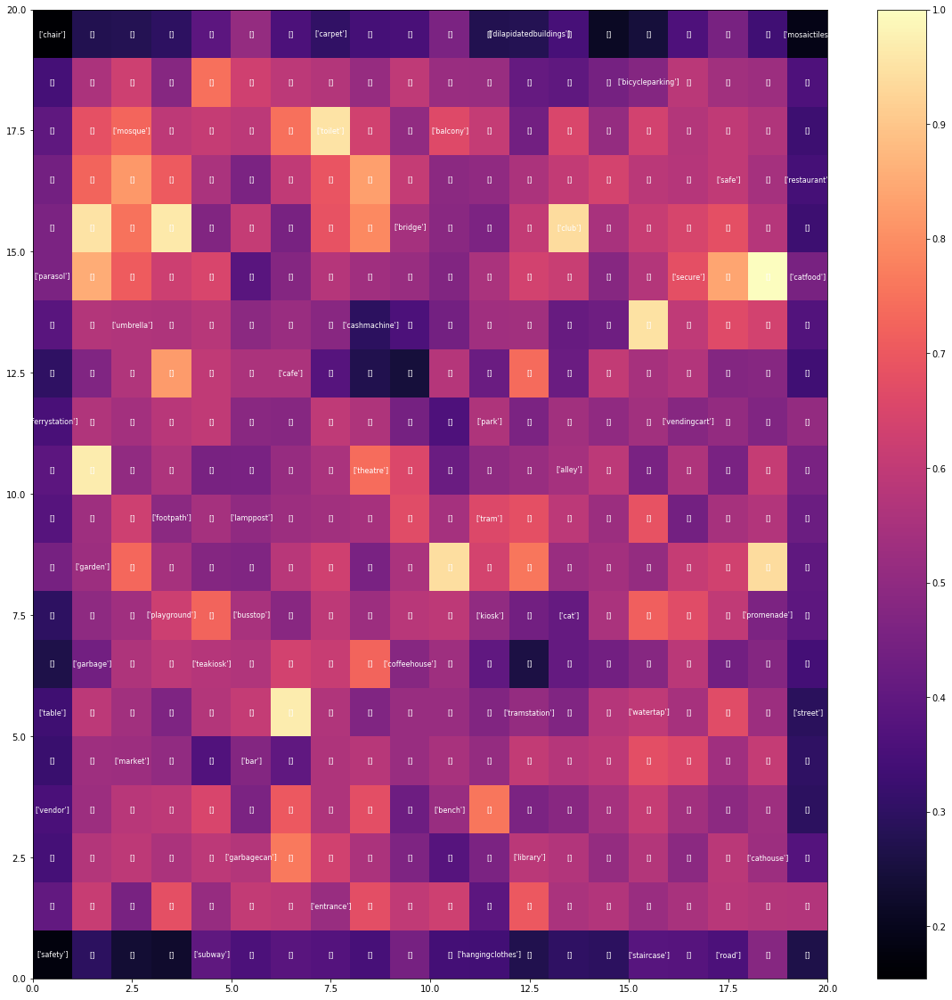

In [16]:
import os
import numpy as np
from minisom import MiniSom
from sklearn.feature_extraction.text import CountVectorizer
from pylab import pcolor, colorbar, plot, text
import matplotlib.pyplot as plt

# Set the path to the folder containing the text files
path_to_folder = "/Users/mansikothari/Documents/UD_MARCH/RC_11/Term_02/Text/merge"

# Read the text files and store the contents and file names in separate lists
text_files = []
file_names = []
for file_name in os.listdir(path_to_folder):
    if file_name.endswith(".txt"):
        with open(os.path.join(path_to_folder, file_name), "r") as file:
            text = file.read()
            text_files.append(text)
            file_names.append(os.path.splitext(file_name)[0])  # remove .txt extension

# Use CountVectorizer to extract features from the text
vectorizer = CountVectorizer(stop_words="english", lowercase=True)
X = vectorizer.fit_transform(text_files).toarray()

# Set the shape of the SOM
som_shape = (20, 20)

# Create the SOM
som = MiniSom(som_shape[0], som_shape[1], X.shape[1], sigma=1.0, learning_rate=0.5)
som.random_weights_init(X)
print("Training...")
som.train_random(X, 100)  # Train for 100 iterations

# Create a list to store the file names for each SOM node
node_file_names = [[] for _ in range(som_shape[0] * som_shape[1])]

# Find the file names for each SOM node
for i in range(len(text_files)):
    data_point = X[i]
    node_index = som.winner(data_point)
    node_file_names[node_index[0] * som_shape[1] + node_index[1]].append(file_names[i])

# Increase the figure size
plt.figure(figsize=(20, 20))

# Visualize the SOM using the U-matrix and add text labels for each cell
u = som.distance_map().T
pcolor(u, cmap='magma')
colorbar()

# Add text label for each cell
for i in range(som_shape[0]):
    for j in range(som_shape[1]):
        idx = i * som_shape[1] + j
        text_color = 'white' if u[i][j] < np.mean(u) else 'black'
        plt.text(j+0.5, i+0.5, str(node_file_names[idx]), color='white', ha='center', va='center', fontsize=8)

# Save the plot with higher dpi
plt.savefig('som.png', dpi=300)


Training...


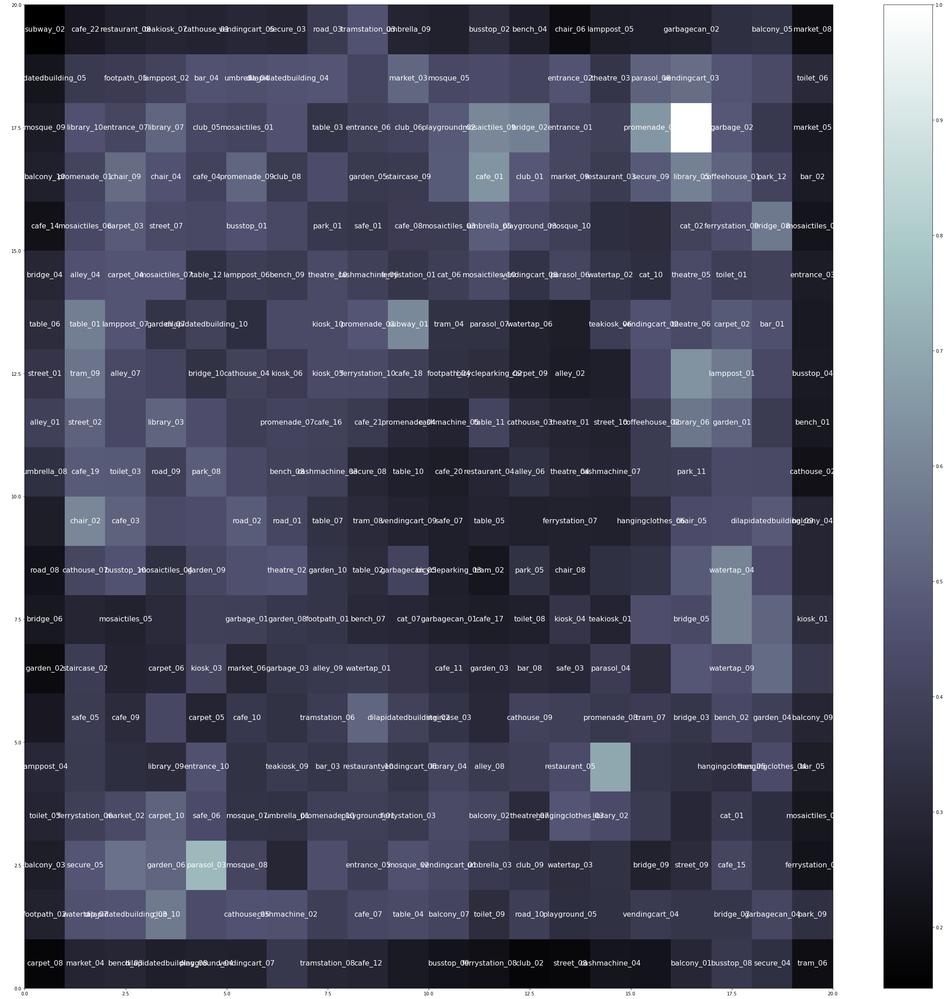

In [9]:
import os
import numpy as np
from minisom import MiniSom
from sklearn.feature_extraction.text import CountVectorizer
from pylab import pcolor, colorbar, plot, text
import matplotlib.pyplot as plt

# Set the path to the folder containing the text files
path_to_folder = "/Users/mansikothari/Documents/UD_MARCH/RC_11/Term_02/Text/txtfiles"

# Read the text files and store the contents and file names in separate lists
text_files = []
file_names = []
for file_name in os.listdir(path_to_folder):
    if file_name.endswith(".txt"):
        with open(os.path.join(path_to_folder, file_name), "r") as file:
            text = file.read()
            text_files.append(text)
            file_names.append(os.path.splitext(file_name)[0])  # remove .txt extension

# Use CountVectorizer to extract features from the text
vectorizer = CountVectorizer(stop_words="english", lowercase=True)
X = vectorizer.fit_transform(text_files).toarray()

# Set the shape of the SOM
som_shape = (20,20)

# Create the SOM
som = MiniSom(som_shape[0], som_shape[1], X.shape[1], sigma=1.0, learning_rate=0.5)
som.random_weights_init(X)
print("Training...")
som.train_random(X, 1000)  # Train for 100 iterations

# Create a list to store the file names for each SOM node
node_file_names = [[] for _ in range(som_shape[0] * som_shape[1])]

# Find the file names for each SOM node
for i in range(len(text_files)):
    data_point = X[i]
    node_index = som.winner(data_point)
    node_file_names[node_index[0] * som_shape[1] + node_index[1]].append(file_names[i])

# Increase the figure size
plt.figure(figsize=(40,40))

# Visualize the SOM using the U-matrix and add text labels for each cell
u = som.distance_map().T
pcolor(u, cmap='bone')
colorbar()

# Add text label for each cell
for i in range(som_shape[0]):
    for j in range(som_shape[1]):
        idx = i * som_shape[1] + j
        text_color = 'white' if u[i][j] < np.mean(u) else 'black'
        if node_file_names[idx]:
            plt.text(j+0.5, i+0.5, node_file_names[idx][0], color='white', ha='center', va='center', fontsize=16)



# Save the plot with higher dpi
plt.savefig('som.png', dpi=300)
